<a href="https://colab.research.google.com/github/amanmehra-23/AirBnB-price-prediction/blob/main/Airbnbeda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Aman Mehra 60009220216

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from IPython.display import IFrame

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Airbnb/final_data.csv")

<ipython-input-27-f2a1aee93d0d>:1: DtypeWarning:

Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
map_center = [df['latitude'].mean(), df['longitude'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=12)
for _, row in df.dropna(subset=['latitude', 'longitude']).iterrows():
    folium.Marker([row['latitude'], row['longitude']]).add_to(folium_map)
folium_map.save('/content/drive/MyDrive/Airbnb/new_map.html')



In [ ]:
folium_map

In [ ]:
amenities_count = []
for i in df["amenities"]:
    amenities_count.append(len(i))

df["amenities"] = amenities_count

In [ ]:
def plot_catplot(h,v,he,a):
    sns.set(font_scale=1.5)
    sns.catplot(x=h,kind=v,data=df,height=he, aspect = a)

# Function to plot catplot graphs


<ipython-input-32-8258b116a5ee>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




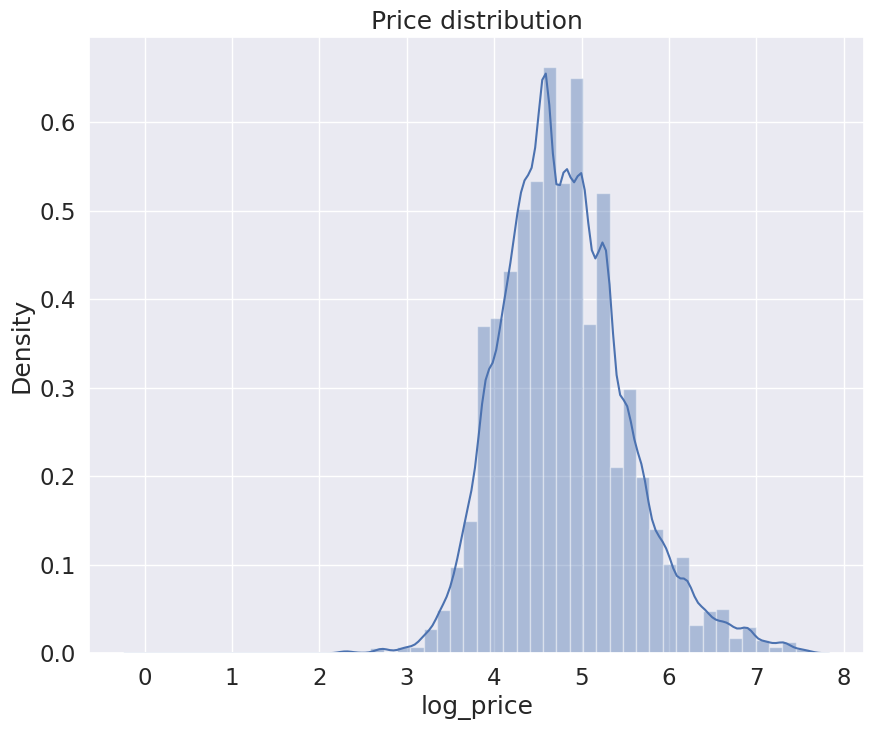

In [ ]:
plt.figure(figsize = (10, 8))
sns.distplot(df["log_price"])
plt.title('Price distribution')
plt.show()

This Shows the distribution of the log price values of the airbnbs in the data

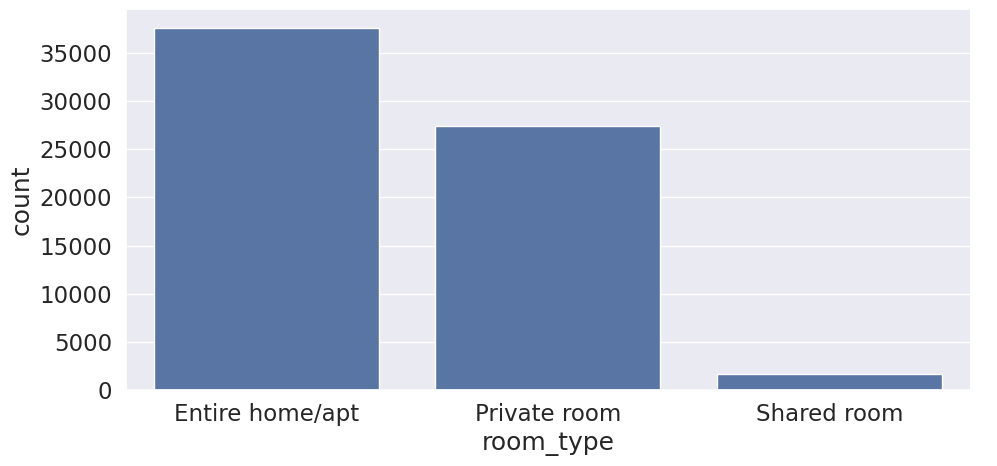

In [ ]:
plot_catplot("room_type", "count", 5, 2)

This is a count plot shows the different room types present in the data which can then be encoded when making predcitions

In [ ]:
fig = px.pie(df, names='room_type', title='Distribution of Room Types')
fig.show()

This pie plot shows things as a percentage split of different typoes of rooms

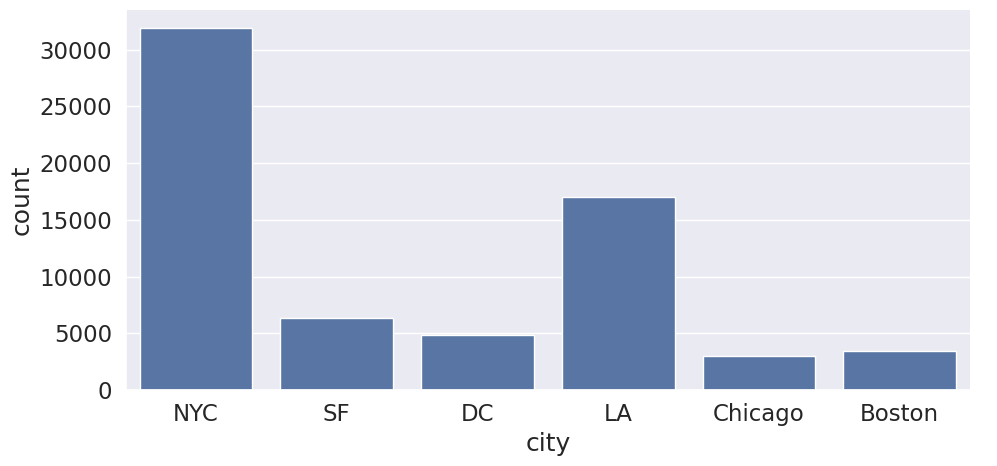

In [ ]:
plot_catplot("city","count", 5, 2)

This shows the distributuion of the airbnbs across different states in the united states which also factor in decding the price

In [ ]:
fig = px.pie(df, names='city', title='City Distribution', hole=0.3,
             labels={'city':'City'},
             hover_data={'city':True})

# Optional customization
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

Doughnut chart show the breakdown as percentage shwoing max places of the airbnb data are from new york

In [ ]:
import plotly.graph_objects as go
data = df['neighbourhood'].value_counts().head(15)

# Reverse the data to display in descending order
data = data[::-1]

# Create the plotly figure
fig = go.Figure()

# Add horizontal bar trace
fig.add_trace(go.Bar(
    x=data.values,
    y=data.index,
    orientation='h'
))

# Update layout
fig.update_layout(
    title="Most popular Neighbourhood",
    xaxis_title="Number of guests who host in this area",
    yaxis_title="Neighbourhood Area",
    yaxis=dict(autorange="reversed"),
    width=1000,
    height=800
)

# Show plot
fig.show()

This goes into more depth showing a detailed area wise distribution of the number of guests hosted which adds crediblity to the place with wilamsburg having the maximum number of guests

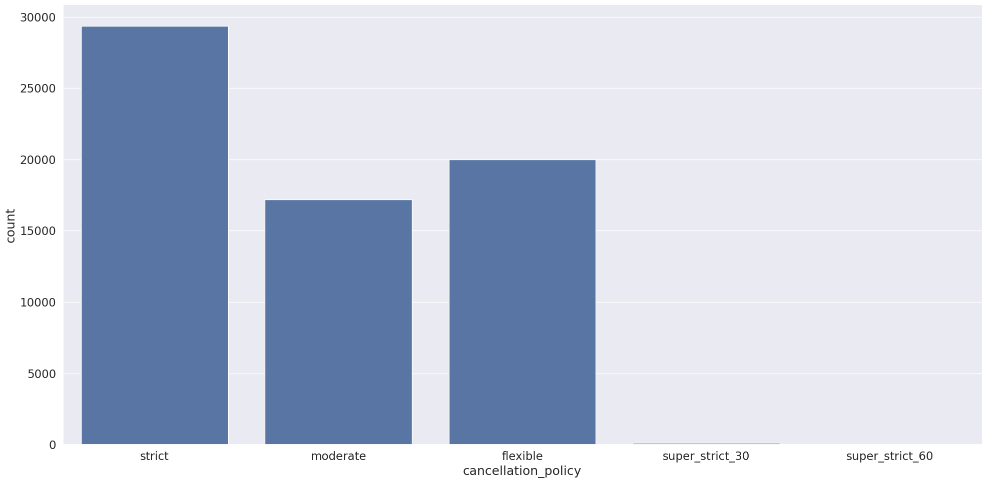

In [ ]:
plot_catplot("cancellation_policy","count",10, 2)

The degree of cancelation policy makes a pivitol decing factor while choosing and air bnb and this shows the distribution of it

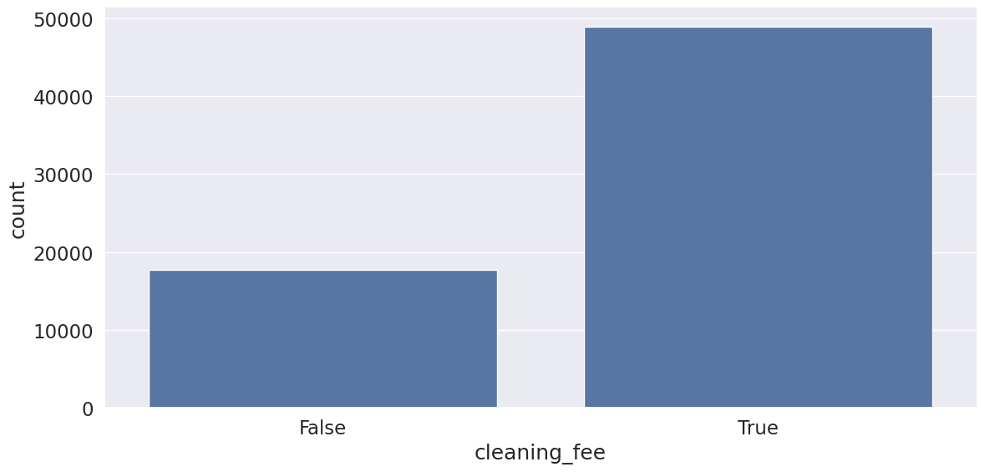

In [ ]:
plot_catplot("cleaning_fee","count",6,2)

The cleaning fee can be factored in the cost of the rental shwoing how major portion charge for the cleaning fee

In [ ]:
def plot_boxplot(x, y):
    fig = px.box(df, x=x, y=y, title='Box Plot')
    fig.update_traces(marker=dict(color='rgb(31, 119, 180)'), line=dict(color='rgb(8,48,107)'))
    fig.update_layout(xaxis_title=x, yaxis_title=y)
    fig.show()

In [ ]:
def plot_violinplot(x, y):
    fig = px.violin(df, x=x, y=y, box=True, points='all', title='Density and distribution of prices')
    fig.update_traces(marker=dict(color='rgb(31, 119, 180)', opacity=0.5), line=dict(color='rgb(8,48,107)'))
    fig.update_layout(xaxis_title=x, yaxis_title=y)
    fig.show()

In [ ]:
plot_boxplot("city","log_price")

This box plot shows the mean-avg upper quartile anbd lowere quartile of each city and highlight the outliers in prices showing in general that SF has the highest prices for air bnb

In [ ]:
plot_boxplot("room_type","log_price")

This shows majority entire homes overall costs more than other room type althoiugh showing many private rooms have many outliers

In [ ]:
plot_violinplot("cancellation_policy","log_price")

This violinplot shows the price in comparison the calcenaltion policy



In [ ]:
plot_violinplot("bed_type","log_price")

This violinplot shows the price in comparison the types of beds shwoing there are many outliers in Real bed and its also the most dense witgh most types

In [ ]:
from plotly.subplots import make_subplots
value_counts_profile_pic = df['host_has_profile_pic'].value_counts().reset_index()
value_counts_profile_pic.columns = ['Host Has Profile Picture', 'Count']

# Count values for host_identity_verified
value_counts_identity_verified = df['host_identity_verified'].value_counts().reset_index()
value_counts_identity_verified.columns = ['Host Identity Verified', 'Count']

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("Host Has Profile Picture", "Host Identity Verified"))

# Add bar graph for host_has_profile_pic
fig.add_trace(
    go.Bar(x=value_counts_profile_pic['Host Has Profile Picture'], y=value_counts_profile_pic['Count'], name='Profile Pic'),
    row=1, col=1
)

# Add bar graph for host_identity_verified
fig.add_trace(
    go.Bar(x=value_counts_identity_verified['Host Identity Verified'], y=value_counts_identity_verified['Count'], name='Identity Verified'),
    row=1, col=2
)

# Update layout
fig.update_layout(title='Counts of Hosts with Profile Picture and Identity Verified')

# Show plot
fig.show()

This shows that around the price range of 3 to 7.5 the review score rating is in fgood with higher 80s to 100s value

The shows that majority of the poeple hosting have a profile pic in comparison to very few who dont

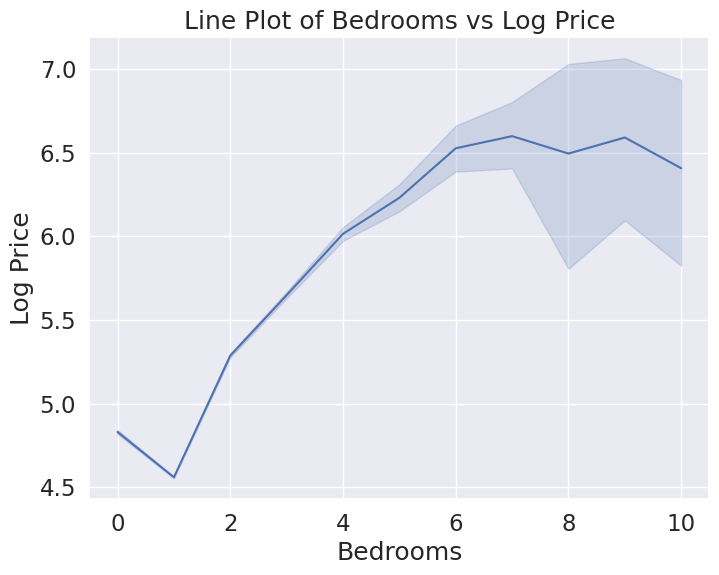

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='bedrooms', y='log_price', data=df)
plt.title('Line Plot of Bedrooms vs Log Price')
plt.xlabel('Bedrooms')
plt.ylabel('Log Price')
plt.show()


This shows the corelations between the price of the airbnb as in increases with the number of bedroom with the rate of increase slows down after 6 rooms

In [ ]:
property_type_counts = df["property_type"].value_counts().reset_index()

property_type_counts.columns = ['Property Type', 'Count']

fig = px.bar(property_type_counts, x='Count', y='Property Type', orientation='h',
             title='Distribution of Property Types',
             labels={'Property Type': 'Property Type', 'Count': 'Count'})

fig.show()

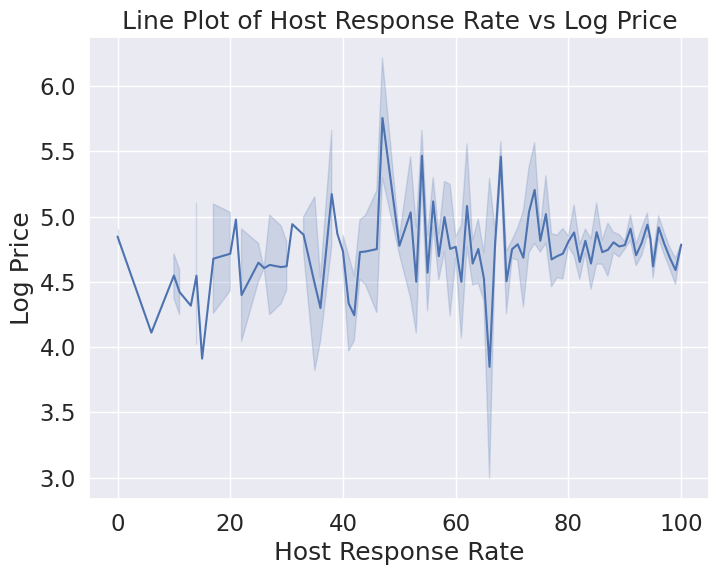

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='host_response_rate', y='log_price', data=df)
plt.title('Line Plot of Host Response Rate vs Log Price')
plt.xlabel('Host Response Rate')
plt.ylabel('Log Price')
plt.show()


This shows that a response rate does not affect the the log price much

In [ ]:
instant_bookable_counts = df["instant_bookable"].value_counts().reset_index()
instant_bookable_counts.columns = ['Instant Bookable', 'Count']
fig = px.pie(instant_bookable_counts, values='Count', names='Instant Bookable',
             title='Distribution of Instant Bookable Status')
fig.show()

This shows the percentage of properties thta are instantly bookable being majorly 74%